In [51]:
!pip install pandas
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn
!pip install -U scikit-learn
!pip install tabulate


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [60]:
!pip install tabulate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.utils._cython_blas
from pandas_profiling import ProfileReport
from sklearn import preprocessing 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA 
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve, auc

In [3]:
from google.colab import files
uploaded = files.upload()

Saving Dry_Bean_Dataset.csv to Dry_Bean_Dataset.csv


DATASET

In [4]:
import io
df = pd.read_csv(io.BytesIO(uploaded['Dry_Bean_Dataset.csv']))
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653247,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


REPORT

In [5]:
profile = ProfileReport(df, title="Data Analysis Report", html={'style':{'full_width':False}})

In [6]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

SAMPLING TEST/TRAIN

In [115]:
X= df.drop(columns='Class')
Y=df['Class']
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)




(13611, 16) (10888, 16) (2723, 16)
(13611,) (10888,) (2723,)


T-SNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


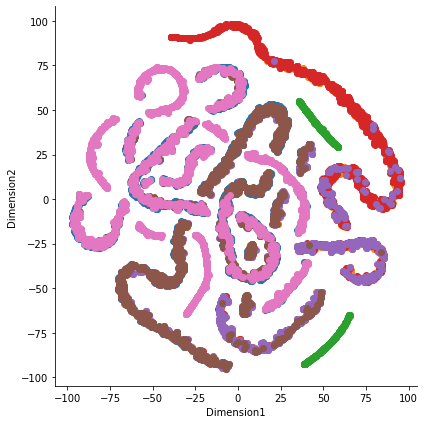

In [8]:
points=X[0:13611:]
data_label=Y[0:13611:]
tsne = TSNE(n_components=2, random_state = 10)
tsne_emb = tsne.fit_transform(points)

tsne_data=np.vstack((tsne_emb.T , data_label)).T
tsne_df=pd.DataFrame(data=tsne_data, columns=("Dimension1","Dimension2","label"))
sns.FacetGrid(tsne_df , hue="label" , size=6).map(plt.scatter , 'Dimension1','Dimension2')
plt.show()

NAIVE BAYES (Bernoulli)

In [71]:
BernNB = BernoulliNB(binarize = True)
BernNB.fit(X_train, Y_train)
print(BernNB)
print()

Y_expect = Y_test
Y_pred = BernNB.predict(X_test)
print ("Accuracy :",accuracy_score(Y_expect, Y_pred))
print()
print ("Precision: ",precision_score(Y_test, Y_pred, average='macro'))
print()
print ("F1: ",f1_score(Y_test, Y_pred, average='macro'))
print()
print ("Recall: ",recall_score(Y_expect, Y_pred, average=None))


BernoulliNB(binarize=True)

Accuracy : 0.25156077855306647

Precision:  0.035937254079009495

F1:  0.05742790073775989

Recall:  [0. 0. 0. 1. 0. 0. 0.]


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


NAIVE BAYES (Gaussian)

In [70]:
GausNB = GaussianNB()
GausNB.fit(X_train, Y_train)
print (GausNB)
print()

Y_expect = Y_test
Y_pred =GausNB.predict(X_test)
print ("Accuracy: ",accuracy_score(Y_expect, Y_pred))
print()
print ("Precision: ",precision_score(Y_expect, Y_pred, average='macro'))
print()
print ("F1: ",f1_score(Y_expect, Y_pred, average='macro'))
print()
print ("Recall: ",recall_score(Y_expect, Y_pred, average=None))

GaussianNB()

Accuracy:  0.7623944179214102

Precision:  0.7709230622173386

F1:  0.7647969270732836

Recall:  [0.45833333 1.         0.76948052 0.84963504 0.78947368 0.71359223
 0.78125   ]


PCA FOR 1st COMPONENT

In [96]:
#PCA
pca = PCA(n_components = 4, random_state = 10)  
X_pca = pca.fit_transform(X)
X_pca = pca.transform(X)
print(X.shape)
print(X_pca.shape)

#Splitting of reduced dimension dataset
X= X_pca
Y= Y
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

split_data(X,Y)

#Training 
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)

(13611, 16)
(13611, 4)
(13611, 4) (10888, 4) (2723, 4)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  90.34153507161218

Precision for Test Set:  91.71079963859577

F1 for Test Set:  91.51792264470042

Recall for Test Set:  [ 85.41666667 100.          91.88311688  93.43065693  94.73684211
  93.93203883  80.51470588]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


PCA FOR 2nd COMPONENT

In [109]:
#PCA
pca = PCA(n_components = 6, random_state = 10)  
X_pca = pca.fit_transform(X)
X_pca = pca.transform(X)
print(X.shape)
print(X_pca.shape)

#Splitting of reduced dimension dataset
X= X_pca
Y= Y
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

split_data(X,Y)

#Training 
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)

(13611, 16)
(13611, 6)
(13611, 6) (10888, 6) (2723, 6)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  92.10429673154609

Precision for Test Set:  93.78208779772119

F1 for Test Set:  93.31164604405993

Recall for Test Set:  [ 86.45833333 100.          95.45454545  93.13868613  94.21052632
  94.17475728  87.31617647]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


PCA FOR 3rd COMPONENT

In [112]:
#PCA
pca = PCA(n_components = 8, random_state = 10)  
X_pca = pca.fit_transform(X)
X_pca = pca.transform(X)
print(X.shape)
print(X_pca.shape)

#Splitting of reduced dimension dataset
X= X_pca
Y= Y
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

split_data(X,Y)

#Training 
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)

(13611, 16)
(13611, 8)
(13611, 8) (10888, 8) (2723, 8)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  92.14102093279472

Precision for Test Set:  93.76543015299886

F1 for Test Set:  93.3508357256948

Recall for Test Set:  [ 87.5        100.          94.80519481  92.99270073  94.21052632
  94.17475728  87.5       ]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


PCA FOR 4th COMPONENT

In [114]:
#PCA
pca = PCA(n_components = 10, random_state = 10)  
X_pca = pca.fit_transform(X)
X_pca = pca.transform(X)
print(X.shape)
print(X_pca.shape)

#Splitting of reduced dimension dataset
X= X_pca
Y= Y
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

split_data(X,Y)

#Training 
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)

(13611, 16)
(13611, 10)
(13611, 10) (10888, 10) (2723, 10)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  92.06757253029747

Precision for Test Set:  93.74251756373242

F1 for Test Set:  93.29720585313191

Recall for Test Set:  [ 86.80555556 100.          95.45454545  92.99270073  94.21052632
  94.17475728  87.13235294]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


PCA FOR 5th COMPONENT

In [116]:
#PCA
pca = PCA(n_components = 12, random_state = 10)  
X_pca = pca.fit_transform(X)
X_pca = pca.transform(X)
print(X.shape)
print(X_pca.shape)

#Splitting of reduced dimension dataset
X= X_pca
Y= Y
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

split_data(X,Y)

#Training 
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)

(13611, 16)
(13611, 12)
(13611, 12) (10888, 12) (2723, 12)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  92.06757253029747

Precision for Test Set:  93.75827152640188

F1 for Test Set:  93.28931055853147

Recall for Test Set:  [ 86.45833333 100.          95.45454545  92.99270073  94.21052632
  94.17475728  87.31617647]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


ROC-AUC 

In [81]:
auc_logistic = roc_curve(Y_test, Y_pred)
auc_logistic = auc(X_test, X_train)

svm_fpr, svm_tpr, threshold = roc_curve(Y_test, Y_pred)
auc_svm = auc(svm_fpr, svm_tpr)

plt.figure(figsize=(5, 5), dpi=100)
plt.plot(svm_fpr, svm_tpr, linestyle='-', label='SVM (auc = %0.3f)' % auc_svm)
plt.plot(X_test, X_train, marker='.', label='Logistic (auc = %0.3f)' % auc_logistic)

plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')

plt.legend()

plt.show()

ValueError: ignored

COMPARE LOGISTIC AND NAIVE BAYES


In [117]:
#Splitting the data 
X= df.drop(columns='Class')
Y=df['Class']
def split_data(X,Y):
  X_train, X_test,Y_train,Y_test= train_test_split( X, Y, test_size=0.2, random_state=2)
  data_splitted= [X_train, X_test,Y_train,Y_test]
  return data_splitted
arr=split_data(X,Y)  
X_train=arr[0]
X_test=arr[1]
Y_train=arr[2]
Y_test=arr[3]
print(X.shape , X_train.shape , X_test.shape)
print(Y.shape,Y_train.shape , Y_test.shape)

#Appling Logistic Regression
logistic_regression = LogisticRegression(max_iter=10000)
logistic_regression.fit(X_train,Y_train)

Y_pred_train=logistic_regression.predict(X_train)
Y_pred_test=logistic_regression.predict(X_test)

print("Accuracy for Test Set: ", metrics.accuracy_score(Y_test, Y_pred_test)*100)
print()

print("Precision for Test Set: ", metrics.precision_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("F1 for Test Set: ", metrics.f1_score(Y_test, Y_pred_test, average='macro')*100)
print()

print("Recall for Test Set: ", metrics.recall_score(Y_test, Y_pred_test, average=None)*100)


(13611, 16) (10888, 16) (2723, 16)
(13611,) (10888,) (2723,)
Accuracy for Test Set:  91.73705471905987

Precision for Test Set:  93.39522399852765

F1 for Test Set:  92.99588879260997

Recall for Test Set:  [ 86.11111111 100.          95.45454545  93.13868613  95.26315789
  93.68932039  85.29411765]
